# Objective and Context

The Customer Churn table contains information on all 7,043 customers from a Telecommunications company in California in Q2 2022
Each record represents one customer, and contains details about their demographics, location, tenure, subscription services, status for the quarter (joined, stayed, or churned), and more!


The public dataset is completely available on the Maven Analytics website platform where it stores and consolidates all available datasets for analysis in the Data Playground. The specific telecom customer churn dataset at hand can be obtained in this link below: https://www.mavenanalytics.io/blog/maven-churn-challenge

Objective:
-To make a model to predict wheather a customer will be churned or not

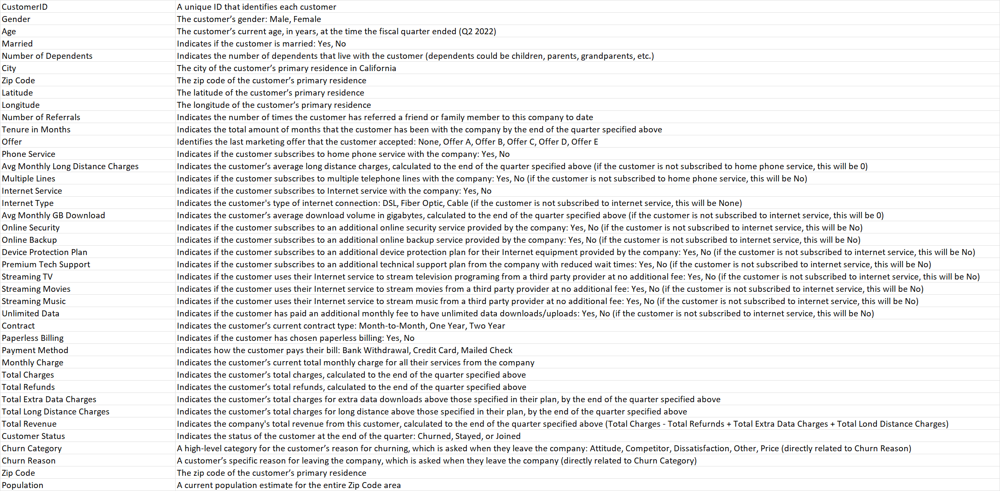

# Importing the necessary libraries and data overview:-

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno

from time import perf_counter

import warnings
warnings.filterwarnings('ignore')

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn import svm
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier
from sklearn import metrics
from sklearn.metrics import roc_curve
from sklearn.metrics import recall_score, confusion_matrix, precision_score, f1_score, accuracy_score, classification_report

from sklearn.ensemble import VotingClassifier
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import f1_score, precision_score, recall_score, fbeta_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import KFold
from sklearn import feature_selection
from sklearn import model_selection
from sklearn import metrics
from sklearn.metrics import classification_report, precision_recall_curve
from sklearn.metrics import auc, roc_auc_score, roc_curve
from sklearn.metrics import make_scorer, recall_score, log_loss
from sklearn.metrics import average_precision_score
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import roc_curve, roc_auc_score

In [ ]:
import xgboost
import shap
from lime.lime_tabular import LimeTabularExplainer
import matplotlib.pyplot as plt

%matplotlib inline

In [ ]:
from google.colab import files
file=files.upload()
df=pd.read_csv("telecom_customer_churn.csv")
df.head()

Saving telecom_customer_churn.csv to telecom_customer_churn (1).csv


,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,...,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason
0,0002-ORFBO,Female,37,Yes,0,Frazier Park,93225,34.827662,-118.999073,2,...,Credit Card,65.6,593.30,0.00,0,381.51,974.81,Stayed,NaN,NaN
1,0003-MKNFE,Male,46,No,0,Glendale,91206,34.162515,-118.203869,0,...,Credit Card,-4.0,542.40,38.33,10,96.21,610.28,Stayed,NaN,NaN
2,0004-TLHLJ,Male,50,No,0,Costa Mesa,92627,33.645672,-117.922613,0,...,Bank Withdrawal,73.9,280.85,0.00,0,134.60,415.45,Churned,Competitor,Competitor had better devices
3,0011-IGKFF,Male,78,Yes,0,Martinez,94553,38.014457,-122.115432,1,...,Bank Withdrawal,98.0,1237.85,0.00,0,361.66,1599.51,Churned,Dissatisfaction,Product dissatisfaction
4,0013-EXCHZ,Female,75,Yes,0,Camarillo,93010,34.227846,-119.079903,3,...,Credit Card,83.9,267.40,0.00,0,22.14,289.54,Churned,Dissatisfaction,Network reliability


# Printing general information about the dataset

In [ ]:
df.isnull().sum()

Customer ID                             0
Gender                                  0
Age                                     0
Married                                 0
Number of Dependents                    0
City                                    0
Zip Code                                0
Latitude                                0
Longitude                               0
Number of Referrals                     0
Tenure in Months                        0
Offer                                3877
Phone Service                           0
Avg Monthly Long Distance Charges     682
Multiple Lines                        682
Internet Service                        0
Internet Type                        1526
Avg Monthly GB Download              1526
Online Security                      1526
Online Backup                        1526
Device Protection Plan               1526
Premium Tech Support                 1526
Streaming TV                         1526
Streaming Movies                  

In [ ]:
df.dtypes

Customer ID                           object
Gender                                object
Age                                    int64
Married                               object
Number of Dependents                   int64
City                                  object
Zip Code                               int64
Latitude                             float64
Longitude                            float64
Number of Referrals                    int64
Tenure in Months                      object
Offer                                 object
Phone Service                         object
Avg Monthly Long Distance Charges    float64
Multiple Lines                        object
Internet Service                      object
Internet Type                         object
Avg Monthly GB Download              float64
Online Security                       object
Online Backup                         object
Device Protection Plan                object
Premium Tech Support                  object
Streaming 

Dealing with missing values

In [ ]:
df.columns=df.columns.str.replace(" ","").str.lower()

In [ ]:
df.avgmonthlylongdistancecharges=df.avgmonthlylongdistancecharges.fillna(0.0)

In [ ]:
df.multiplelines=df.multiplelines.fillna('no phone service')

In [ ]:
no_internet=['internettype','onlinesecurity','onlinebackup','deviceprotectionplan','premiumtechsupport','streamingtv',
             'streamingmovies','streamingmusic','unlimiteddata']
df[no_internet]=df[no_internet].fillna('no internet service')

In [ ]:
df.avgmonthlygbdownload=df.avgmonthlygbdownload.fillna(0)

In [ ]:
import folium
import os


# Create a map centered around the average latitude and longitude of the dataset
latitude_mean = df['Latitude'].mean()
longitude_mean = df['Longitude'].mean()
m = folium.Map(location=[latitude_mean, longitude_mean], zoom_start=10)

# Add markers for each data point
for index, row in df.iterrows():
    popup_text = f"Customer ID: {row['Customer ID']}, City: {row['City']}"
    folium.Marker([row['Latitude'], row['Longitude']], popup=popup_text).add_to(m)

m


In [ ]:
import folium

churned_df = df[df['Customer Status'] == 'Churned']
stayed_df = df[df['Customer Status'] == 'Stayed']

# Create a map centered around the average latitude and longitude of the dataset
latitude_mean = df['Latitude'].mean()
longitude_mean = df['Longitude'].mean()
m = folium.Map(location=[latitude_mean, longitude_mean], zoom_start=10)

# Add markers for churned customers (red)
for index, row in churned_df.iterrows():
    popup_text = f"Customer ID: {row['Customer ID']}, City: {row['City']}"
    folium.Marker([row['Latitude'], row['Longitude']], popup=popup_text, icon=folium.Icon(color='red')).add_to(m)

# Add markers for stayed customers (green)
for index, row in stayed_df.iterrows():
    popup_text = f"Customer ID: {row['Customer ID']}, City: {row['City']}"
    folium.Marker([row['Latitude'], row['Longitude']], popup=popup_text, icon=folium.Icon(color='green')).add_to(m)
m


In [ ]:
df=df.drop(columns=['customerid','churncategory','churnreason','totalrefunds','zipcode','longitude','latitude','city'], axis=1)

In [ ]:
df.isnull().sum()

gender                              0
age                                 0
married                             0
numberofdependents                  0
numberofreferrals                   0
tenureinmonths                      0
offer                            3877
phoneservice                        0
avgmonthlylongdistancecharges       0
multiplelines                       0
internetservice                     0
internettype                        0
avgmonthlygbdownload                0
onlinesecurity                      0
onlinebackup                        0
deviceprotectionplan                0
premiumtechsupport                  0
streamingtv                         0
streamingmovies                     0
streamingmusic                      0
unlimiteddata                       0
contract                            0
paperlessbilling                    0
paymentmethod                       0
monthlycharge                       0
totalcharges                        0
totalextrada

Dropping those customers whose status is "Joined"

In [ ]:
df=df.loc[~df.customerstatus.str.contains('Joined')]
df.reset_index(drop=True,inplace=True)

Feature Transformation

In [ ]:
le = LabelEncoder()
# Label Encoding will be used for columns with 2 or less unique

le_count = 0
for col in df.columns[1:]:
    if df[col].dtype == 'object':
      if len(list(df[col].unique())) <= 2:
        print(col)
        le.fit(df[col])
        df[col] = le.transform(df[col])
        le_count += 1
print('{} columns were label encoded.'.format(le_count))

married
phoneservice
internetservice
paperlessbilling
customerstatus
5 columns were label encoded.


In [ ]:
df['gender'] = [1 if each == 'Female' else 0 for each in df['gender']]

In [ ]:
def encode_data(dataframe):
    if dataframe.dtype == "object":
        dataframe = LabelEncoder().fit_transform(dataframe)
    return dataframe

data = df.apply(lambda x: encode_data(x))
data.head()

,gender,age,married,numberofdependents,numberofreferrals,tenureinmonths,offer,phoneservice,avgmonthlylongdistancecharges,multiplelines,...,unlimiteddata,contract,paperlessbilling,paymentmethod,monthlycharge,totalcharges,totalextradatacharges,totallongdistancecharges,totalrevenue,customerstatus
0,1,37,1,0,2,71,5,1,42.39,0,...,1,1,1,1,65.6,593.30,0,381.51,974.81,1
1,0,46,0,0,0,71,5,1,10.69,1,...,0,0,0,1,-4.0,542.40,10,96.21,610.28,1
2,0,50,0,0,0,33,4,1,33.65,0,...,1,0,1,0,73.9,280.85,0,134.60,415.45,0
3,0,78,1,0,1,4,3,1,27.82,0,...,1,0,1,0,98.0,1237.85,0,361.66,1599.51,0
4,1,75,1,0,3,22,5,1,7.38,0,...,1,0,1,1,83.9,267.40,0,22.14,289.54,0


In [ ]:
data.to_csv('mycsvfile.csv',index=False)

In [ ]:
X = data.drop(columns = "customerstatus")
y = data["customerstatus"].values

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 4, stratify =y)

In [ ]:
col=['totalcharges','avgmonthlylongdistancecharges','monthlycharge','totalrevenue','totallongdistancecharges',
     'tenureinmonths','totallongdistancecharges','totalextradatacharges']

In [ ]:
scaler = StandardScaler()
X_train[col] = StandardScaler().fit_transform(X_train[col])
X_test[col] = StandardScaler().fit_transform(X_test[col])


# Model Building

In total four models are trained:

Logistic Regression

Support Vector Machine

Random Forest

Decision Tree Classifier


In [ ]:
models = []
models.append(('Logistic Regression', LogisticRegression()))
models.append(('Kernel SVM', SVC()))
models.append(('Random Forest', RandomForestClassifier()))
models.append(('Decision Tree Classifier', DecisionTreeClassifier()))

In [ ]:
acc_results =[]
auc_results =[]
pre_results =[]
f1_results =[]
names = []

result_col = ["Algorithm", "ROC AUC", "Accuracy", "Precision", "f1 Score"]
model_results = pd.DataFrame(columns = result_col)

i=0
# K- fold cross validation

for name, model in models:
    names.append(name)
    # kfold = model_selection.KFold(n_splits=10)

    cv_acc_results = model_selection.cross_val_score(model, X_train, y_train,
                     scoring="accuracy")
    cv_auc_results = model_selection.cross_val_score(model, X_train, y_train,
                     scoring="roc_auc")
    cv_pre_results = model_selection.cross_val_score(model, X_train, y_train,
                     scoring="precision")
    cv_f1_results = model_selection.cross_val_score(model, X_train, y_train,
                     scoring="f1")
    acc_results.append(cv_acc_results)
    auc_results.append(cv_auc_results)
    pre_results.append(cv_pre_results)
    f1_results.append(cv_f1_results)

    model_results.loc[i] = [name,
                           round(cv_acc_results.mean()*100,2),
                           round(cv_auc_results.mean()*100,2),
                           round(cv_pre_results.mean()*100,2),
                           round(cv_f1_results.mean()*100,2)]
    i+=1

model_results.sort_values(by = ['ROC AUC'], ascending=False)

,Algorithm,ROC AUC,Accuracy,Precision,f1 Score
2,Random Forest,86.58,91.88,88.34,91.12
0,Logistic Regression,83.74,90.16,88.56,88.65
3,Decision Tree Classifier,80.31,76.48,87.04,86.51
1,Kernel SVM,79.27,86.11,80.36,86.67


# Below models are runned on Test data set:

# Decision Tree Classifier

In [ ]:
modelD= DecisionTreeClassifier()

In [ ]:
 modelD.fit(X_train, y_train)

DecisionTreeClassifier()

In [ ]:
pred_train_D = modelD.predict(X_train)
pred_test_D=modelD.predict(X_test)

In [ ]:
acc_train_D = accuracy_score(pred_train_D, y_train)
acc_test_D = accuracy_score(pred_test_D, y_test)
print(f'Training accuracy {acc_train_D: .3f}')
print(f'Testing accuracy {acc_test_D: .3f}')

Training accuracy  1.000
Testing accuracy  0.847


In [ ]:
tuned_parameters = [{'criterion':['gini', 'entropy'],
                     'max_leaf_nodes': range(5,25)}] # hyperparameters to tune

clf_D = GridSearchCV(DecisionTreeClassifier(), tuned_parameters,
                   verbose=1, n_jobs=-1) # grid search model
clf_D.fit(X_train, y_train) # evaluate hyper-parameters

print("\nBest parameters found:")
print(clf_D.best_params_) # best hyperparameter balues

print("\nGrid scores:")
means_D = clf_D.cv_results_['mean_test_score'] # mean accuracy with folds
stds_D = clf_D.cv_results_['std_test_score'] # standard deviation of accuracies
# for each hyperparameter combination show mean +/- 2 standard-deviations
for mean, std, params in zip(means_D, stds_D, clf_D.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" %(mean, std * 2, params))

Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best parameters found:
{'criterion': 'entropy', 'max_leaf_nodes': 24}

Grid scores:
0.834 (+/-0.029) for {'criterion': 'gini', 'max_leaf_nodes': 5}
0.842 (+/-0.013) for {'criterion': 'gini', 'max_leaf_nodes': 6}
0.844 (+/-0.012) for {'criterion': 'gini', 'max_leaf_nodes': 7}
0.846 (+/-0.013) for {'criterion': 'gini', 'max_leaf_nodes': 8}
0.852 (+/-0.014) for {'criterion': 'gini', 'max_leaf_nodes': 9}
0.853 (+/-0.013) for {'criterion': 'gini', 'max_leaf_nodes': 10}
0.853 (+/-0.015) for {'criterion': 'gini', 'max_leaf_nodes': 11}
0.853 (+/-0.017) for {'criterion': 'gini', 'max_leaf_nodes': 12}
0.851 (+/-0.012) for {'criterion': 'gini', 'max_leaf_nodes': 13}
0.856 (+/-0.005) for {'criterion': 'gini', 'max_leaf_nodes': 14}
0.855 (+/-0.004) for {'criterion': 'gini', 'max_leaf_nodes': 15}
0.856 (+/-0.005) for {'criterion': 'gini', 'max_leaf_nodes': 16}
0.856 (+/-0.005) for {'criterion': 'gini', 'max_leaf_nodes': 17}
0.855 (+/-0.0

In [ ]:
from sklearn.metrics import roc_curve

criterion = 'gini'
max_leaf_nodes = 19
# Train and test model
good_model_D = DecisionTreeClassifier(criterion=criterion,
                                    max_leaf_nodes=max_leaf_nodes) # create model
print(good_model_D) # display model parameters
good_model_D.fit(X_train, y_train) # train model
pred_D = good_model_D.predict(X_test) # predicted output for test examples
print("Results on test data")
acc_D = accuracy_score(y_test, pred_D) # accuracy on test examples
prec_D = precision_score(y_test, pred_D) # precision on test examples
reca_D = recall_score(y_test, pred_D) # recall on test examples
print(f'Test accuracy = {acc_D: .4f}') # round to 4 decimal places
print(f'Test precision = {prec_D: .4f}') # round to 4 decimal places
print(f'Test recall = {reca_D: .4f}') # round to 4 decimal places
print("Classification report:")
print(classification_report(y_test, pred_D))
print("Confusion matrix (Rows actual, Columns predicted):")
print(pd.DataFrame(confusion_matrix(y_test, pred_D)))


DecisionTreeClassifier(max_leaf_nodes=19)
Results on test data
Test accuracy =  0.8619
Test precision =  0.8633
Test recall =  0.9590
Classification report:
              precision    recall  f1-score   support

           0       0.86      0.62      0.72       561
           1       0.86      0.96      0.91      1416

    accuracy                           0.86      1977
   macro avg       0.86      0.79      0.81      1977
weighted avg       0.86      0.86      0.85      1977

Confusion matrix (Rows actual, Columns predicted):
     0     1
0  346   215
1   58  1358



ROC curve


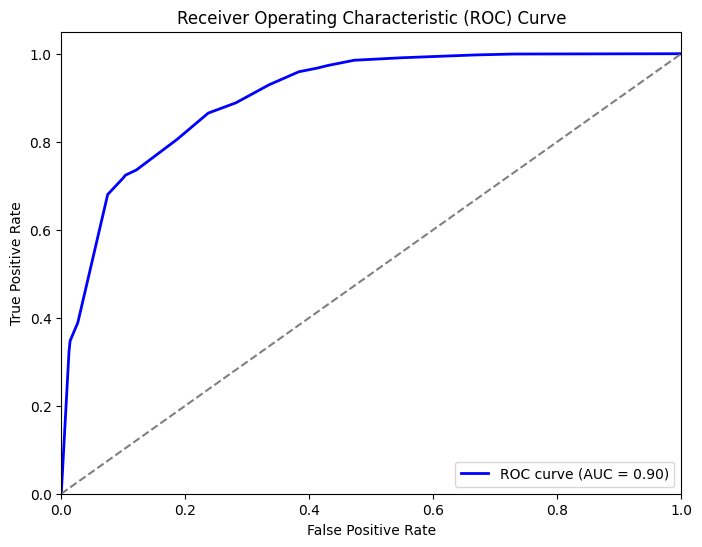

In [ ]:
print('\nROC curve')
 # Interested in the probability of the positive class

# Now we call roc_curve with true labels and predicted probabilities
y_prob = good_model_D.predict_proba(X_test)[:, 1]  # Interested in the probability of the positive class

# Computing ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# Computing Area Under the Curve (AUC)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

## Random Forest model

In [ ]:
modelR = RandomForestClassifier()

In [ ]:
 modelR.fit(X_train, y_train)

RandomForestClassifier()

In [ ]:
pred_train = modelR.predict(X_train)
pred_test=modelR.predict(X_test)

In [ ]:
acc_train = accuracy_score(pred_train, y_train)
acc_test = accuracy_score(pred_test, y_test)
print(f'Training accuracy {acc_train: .3f}')
print(f'Testing accuracy {acc_test: .3f}')

Training accuracy  1.000
Testing accuracy  0.867


In [ ]:
tuned_parameters = [{'n_estimators': [25, 50, 75],
                     'max_features': [15, 20, 25],
                     'max_leaf_nodes': [8, 16, 24]}] # hyperparameters to tune

clfR = GridSearchCV(RandomForestClassifier(), tuned_parameters,
                   verbose=1, n_jobs=-1) # grid search model
clfR.fit(X_train, y_train) # evaluate hyper-parameters

print("\nBest parameters found:")
print(clfR.best_params_) # best hyperparameter values

print("\nGrid scores:")
means = clfR.cv_results_['mean_test_score'] # mean accuracy with folds
stds = clfR.cv_results_['std_test_score'] # standard deviation of accuracies
# for each hyperparameter combination show mean +/- 2 standard-deviations
for mean, std, params in zip(means, stds, clfR.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" %(mean, std * 2, params))

Fitting 5 folds for each of 27 candidates, totalling 135 fits

Best parameters found:
{'max_features': 15, 'max_leaf_nodes': 16, 'n_estimators': 25}

Grid scores:
0.862 (+/-0.014) for {'max_features': 15, 'max_leaf_nodes': 8, 'n_estimators': 25}
0.863 (+/-0.016) for {'max_features': 15, 'max_leaf_nodes': 8, 'n_estimators': 50}
0.863 (+/-0.017) for {'max_features': 15, 'max_leaf_nodes': 8, 'n_estimators': 75}
0.873 (+/-0.014) for {'max_features': 15, 'max_leaf_nodes': 16, 'n_estimators': 25}
0.869 (+/-0.014) for {'max_features': 15, 'max_leaf_nodes': 16, 'n_estimators': 50}
0.866 (+/-0.013) for {'max_features': 15, 'max_leaf_nodes': 16, 'n_estimators': 75}
0.869 (+/-0.011) for {'max_features': 15, 'max_leaf_nodes': 24, 'n_estimators': 25}
0.870 (+/-0.011) for {'max_features': 15, 'max_leaf_nodes': 24, 'n_estimators': 50}
0.869 (+/-0.013) for {'max_features': 15, 'max_leaf_nodes': 24, 'n_estimators': 75}
0.859 (+/-0.016) for {'max_features': 20, 'max_leaf_nodes': 8, 'n_estimators': 25}
0

In [ ]:
max_features = 15
max_leaf_nodes = 16
n_estimators = 50

good_model = RandomForestClassifier(max_leaf_nodes = max_leaf_nodes,
                                    max_features = max_features,
                                    n_estimators=n_estimators, )
print(good_model)
good_model.fit(X_train, y_train)
pred = good_model.predict(X_test)
print("Results on test data")
acc = accuracy_score(y_test, pred)
prec = precision_score(y_test, pred)
reca = recall_score(y_test, pred)
print(f'Test accuracy = {acc: .4f}')
print(f'Test precision = {prec: .4f}')
print(f'Test recall = {reca: .4f}')
print("Classification report:")
print(classification_report(y_test, pred))
print("Confusion matrix (Rows actual, Columns predicted):")
print(pd.DataFrame(confusion_matrix(y_test, pred)))
print('\nROC curve')


RandomForestClassifier(max_features=15, max_leaf_nodes=16, n_estimators=50)
Results on test data
Test accuracy =  0.8629
Test precision =  0.8725
Test recall =  0.9470
Classification report:
              precision    recall  f1-score   support

           0       0.83      0.65      0.73       561
           1       0.87      0.95      0.91      1416

    accuracy                           0.86      1977
   macro avg       0.85      0.80      0.82      1977
weighted avg       0.86      0.86      0.86      1977

Confusion matrix (Rows actual, Columns predicted):
     0     1
0  365   196
1   75  1341

ROC curve


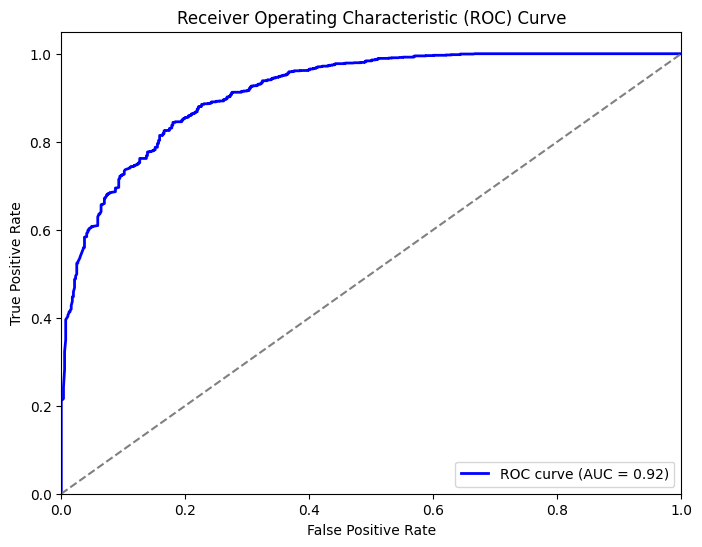

In [ ]:
y_prob = good_model.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

## Support Vector Machine

In [ ]:
modelsvm=svm.SVC().fit(X_train,y_train)

In [ ]:
pred_trainsvm = modelsvm.predict(X_train)
pred_testsvm=modelsvm.predict(X_test)

In [ ]:
acc_trainsvm = accuracy_score(pred_trainsvm, y_train)
acc_testsvm = accuracy_score(pred_testsvm, y_test)
print(f'Training accuracy {acc_trainsvm: .3f}')
print(f'Testing accuracy {acc_testsvm: .3f}')

Training accuracy  0.801
Testing accuracy  0.791


In [ ]:
tuned_parameters = [{'kernel':['linear'], 'gamma':[1], 'C':[1]}]
                     # hyperparameters to tune

clfsvm = GridSearchCV(svm.SVC(), tuned_parameters,
                   verbose=1, n_jobs=-1) # grid search model
clfsvm.fit(X_train,y_train) # evaluate hyper-parameters

print("\nBest parameters found:")
print(clfsvm.best_params_) # best hyperparameter balues

print("\nGrid scores:")
meansvm = clfsvm.cv_results_['mean_test_score'] # mean accuracy with folds
stdsvm = clfsvm.cv_results_['std_test_score'] # standard deviation of accuracies
# for each hyperparameter combination show mean +/- 2 standard-deviations
for mean, std, params in zip(meansvm, stdsvm, clfsvm.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" %(mean, std * 2, params))

Fitting 5 folds for each of 1 candidates, totalling 5 fits

Best parameters found:
{'C': 1, 'gamma': 1, 'kernel': 'linear'}

Grid scores:
0.833 (+/-0.028) for {'C': 1, 'gamma': 1, 'kernel': 'linear'}


In [ ]:
from sklearn import svm
from sklearn.metrics import accuracy_score, precision_score, recall_score, classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import pandas as pd

C = 1
kernel = 'linear'
gamma = 0.1

good_modelsvm = svm.SVC(C=C, kernel=kernel, gamma=gamma, probability=True)
print(good_modelsvm)
good_modelsvm.fit(X_train, y_train)
predsvm = good_modelsvm.predict(X_test)
print("Results on test data")
accsvm = accuracy_score(y_test, predsvm)
precsvm = precision_score(y_test, predsvm)
recasvm = recall_score(y_test, predsvm)
print(f'Test accuracy = {accsvm: .4f}')
print(f'Test precision = {precsvm: .4f}')
print(f'Test recall = {recasvm: .4f}')
print("Classification report:")
print(classification_report(y_test, predsvm))
print("Confusion matrix (Rows actual, Columns predicted):")
print(pd.DataFrame(confusion_matrix(y_test, predsvm)))



SVC(C=1, gamma=0.1, kernel='linear', probability=True)
Results on test data
Test accuracy =  0.8427
Test precision =  0.8883
Test recall =  0.8927
Classification report:
              precision    recall  f1-score   support

           0       0.73      0.72      0.72       561
           1       0.89      0.89      0.89      1416

    accuracy                           0.84      1977
   macro avg       0.81      0.80      0.81      1977
weighted avg       0.84      0.84      0.84      1977

Confusion matrix (Rows actual, Columns predicted):
     0     1
0  402   159
1  152  1264



ROC curve


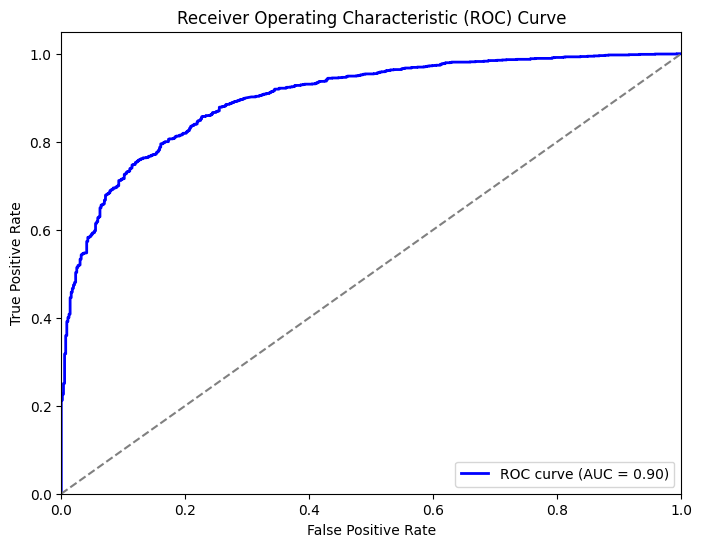

In [ ]:
print('\nROC curve')
y_prob = good_modelsvm.predict_proba(X_test)[:, 1]

# Computing ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# Computing Area Under the Curve (AUC)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

## Logistic Regression

In [ ]:
modelL=LogisticRegression()

In [ ]:
modelL.fit(X_train,y_train)

LogisticRegression()

In [ ]:
pred_trainL = modelL.predict(X_train)
pred_testL=modelL.predict(X_test)

In [ ]:
acc_trainL = accuracy_score(pred_trainL, y_train)
acc_testL = accuracy_score(pred_testL, y_test)
print(f'Training accuracy {acc_trainL: .3f}')
print(f'Testing accuracy {acc_testL: .3f}')

Training accuracy  0.840
Testing accuracy  0.839


In [ ]:
tuned_parameters = [{'C': [10.0, 100.0, 1000.0, 10000.0],
                     'max_iter': [500, 1000]}] # hyperparameters to tune


clfL = GridSearchCV(LogisticRegression(), tuned_parameters,
                   verbose=1, n_jobs=-1) # grid search model
clfL.fit(X_train,y_train) # evaluate hyper-parameters

print("\nBest parameters found:")
print(clfL.best_params_) # best hyperparameter values

print("\nGrid scores:")
meansL = clfL.cv_results_['mean_test_score'] # mean accuracy with folds
stdsL = clfL.cv_results_['std_test_score'] # standard deviation of accuracies
# for each hyperparameter combination show mean +/- 2 standard-deviations
for mean, std, params in zip(meansL, stdsL, clfL.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" %(mean, std * 2, params))

Fitting 5 folds for each of 8 candidates, totalling 40 fits

Best parameters found:
{'C': 10000.0, 'max_iter': 1000}

Grid scores:
0.836 (+/-0.025) for {'C': 10.0, 'max_iter': 500}
0.836 (+/-0.026) for {'C': 10.0, 'max_iter': 1000}
0.836 (+/-0.026) for {'C': 100.0, 'max_iter': 500}
0.836 (+/-0.026) for {'C': 100.0, 'max_iter': 1000}
0.837 (+/-0.026) for {'C': 1000.0, 'max_iter': 500}
0.836 (+/-0.026) for {'C': 1000.0, 'max_iter': 1000}
0.836 (+/-0.027) for {'C': 10000.0, 'max_iter': 500}
0.837 (+/-0.025) for {'C': 10000.0, 'max_iter': 1000}


In [ ]:
# Specifying non-default hyper-parameter values
C = 1000
max_iter = 1000
# Train and test model
good_modelL = LogisticRegression(C = C, max_iter=max_iter) # create model
print(good_modelL) # display model parameters
good_modelL.fit(X_train,y_train) # train model
predL = good_modelL.predict(X_test) # predicted output for test examples
print("Results on test data")
accL = accuracy_score(y_test, predL) # accuracy on test examples
precL = precision_score(y_test, predL) # precision on test examples
recaL = recall_score(y_test, predL) # recall on test examples
print(f'Test accuracy = {accL: .4f}') # round to 4 decimal places
print(f'Test precision = {precL: .4f}') # round to 4 decimal places
print(f'Test recall = {recaL: .4f}') # round to 4 decimal places
print("Classification report:")
print(classification_report(y_test, predL))
print("Confusion matrix (Rows actual, Columns predicted):")
print(pd.DataFrame(confusion_matrix(y_test, predL)))


LogisticRegression(C=1000, max_iter=1000)
Results on test data
Test accuracy =  0.8442
Test precision =  0.8853
Test recall =  0.8990
Classification report:
              precision    recall  f1-score   support

           0       0.73      0.71      0.72       561
           1       0.89      0.90      0.89      1416

    accuracy                           0.84      1977
   macro avg       0.81      0.80      0.81      1977
weighted avg       0.84      0.84      0.84      1977

Confusion matrix (Rows actual, Columns predicted):
     0     1
0  396   165
1  143  1273



ROC curve


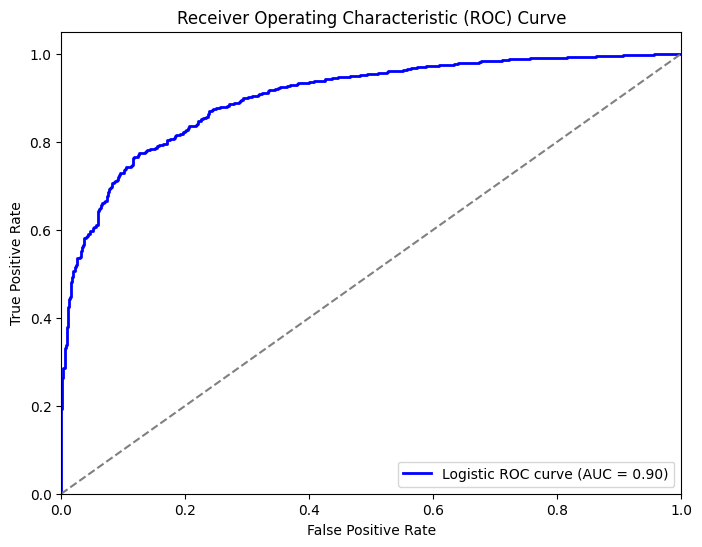

In [ ]:
print('\nROC curve')
y_prob = good_modelL.predict_proba(X_test)[:, 1]

# Computing ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# Computing Area Under the Curve (AUC)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='Logistic ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Summary:

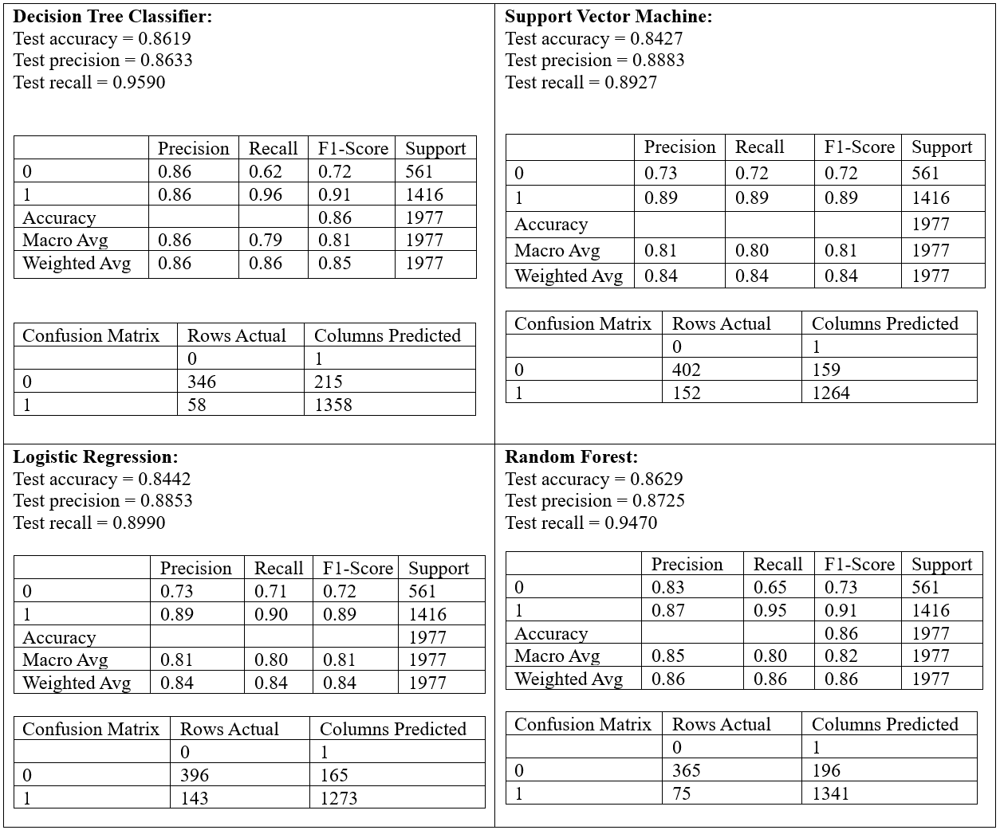

# Conclusion:

Considering the measures for each model mentioned above, the Random Forest Model emerges as the best choice due to its high accuracy, recall, precision, and F1 score. Therefore, the final selected model is the Random Forest

Thank You.